# News Category Dataset

## Context

### Dataset Overview: News Headlines (2012-2022)

- **Total Headlines:** Approximately 210,000
- **Time Span:** 2012 to 2022
- **Data Distribution:**
  - **2012 - May 2018:** ~200,000 headlines
  - **May 2018 - 2022:** ~10,000 headlines


## Content


Each record in the dataset consists of the following attributes:

- **category**: category in which the article was published.
- **headline**: the headline of the news article.
- **authors**: list of authors who contributed to the article.
- **link**: link to the original news article.
- **short_description**: Abstract of the news article.
- **date**: publication date of the article.

# Architechture 

- **Overview**
- **Text Preparation**
- **Exploratory Data Analysis (EDA)**
- **Traditional ML Approach**
- **Deep Learning Approach**
- **Transfer Learning Approach**


# Overview

In [1]:
import pandas as pd
import numpy as np

# Show all columns
pd.set_option("display.max_columns", None)

# Show all rows
pd.set_option("display.max_rows", None)

# Set maximum column width to None to avoid truncation
pd.set_option('display.max_colwidth', None)

In [3]:
df = pd.read_json(r"C:\new\Trainee\News Category Multi-Class Labeled\News_Category_Dataset_v3.json", lines = True)
df.head(5)

,link,headline,category,short_description,authors,date
0,https://www.huffpost.com/entry/covid-boosters-uptake-us_n_632d719ee4b087fae6feaac9,Over 4 Million Americans Roll Up Sleeves For Omicron-Targeted COVID Boosters,U.S. NEWS,Health experts said it is too early to predict whether demand would match up with the 171 million doses of the new boosters the U.S. ordered for the fall.,"Carla K. Johnson, AP",2022-09-23
1,https://www.huffpost.com/entry/american-airlines-passenger-banned-flight-attendant-punch-justice-department_n_632e25d3e4b0e247890329fe,"American Airlines Flyer Charged, Banned For Life After Punching Flight Attendant On Video",U.S. NEWS,"He was subdued by passengers and crew when he fled to the back of the aircraft after the confrontation, according to the U.S. attorney's office in Los Angeles.",Mary Papenfuss,2022-09-23
2,https://www.huffpost.com/entry/funniest-tweets-cats-dogs-september-17-23_n_632de332e4b0695c1d81dc02,23 Of The Funniest Tweets About Cats And Dogs This Week (Sept. 17-23),COMEDY,"""Until you have a dog you don't understand what could be eaten.""",Elyse Wanshel,2022-09-23
3,https://www.huffpost.com/entry/funniest-parenting-tweets_l_632d7d15e4b0d12b5403e479,The Funniest Tweets From Parents This Week (Sept. 17-23),PARENTING,"""Accidentally put grown-up toothpaste on my toddler’s toothbrush and he screamed like I was cleaning his teeth with a Carolina Reaper dipped in Tabasco sauce.""",Caroline Bologna,2022-09-23
4,https://www.huffpost.com/entry/amy-cooper-loses-discrimination-lawsuit-franklin-templeton_n_632c6463e4b09d8701bd227e,Woman Who Called Cops On Black Bird-Watcher Loses Lawsuit Against Ex-Employer,U.S. NEWS,Amy Cooper accused investment firm Franklin Templeton of unfairly firing her and branding her a racist after video of the Central Park encounter went viral.,Nina Golgowski,2022-09-22


- The dataset covers diverse topics, such as "World News," "Wellness," "Travel," "Business," etc.
- We can remove the link because the words in the link are already present in the headline.
- Separate the year, month, and day of the week.
- Check whether all entries in the "category" column are in uppercase.
- Check which cells are empty.


In [4]:
# What is the size of the dataset?

# Provide information about the number of rows and columns
df.shape


(209527, 6)

- **Rows:** 209,527
- **Columns:** 6


In [5]:
# What are the data types of the columns?

# Show the basic information about the dataset
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209527 entries, 0 to 209526
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   link               209527 non-null  object        
 1   headline           209527 non-null  object        
 2   category           209527 non-null  object        
 3   short_description  209527 non-null  object        
 4   authors            209527 non-null  object        
 5   date               209527 non-null  datetime64[ns]
dtypes: datetime64[ns](1), object(5)
memory usage: 9.6+ MB


- The data types of the columns are object type, except for the "data" column.


In [6]:
# Are there any missing values in the dataset?
df.isnull().sum()


link                 0
headline             0
category             0
short_description    0
authors              0
date                 0
dtype: int64

- There are no missing values.


In [7]:
# What does the data look like?
df.describe(include=['object', 'datetime'])


,link,headline,category,short_description,authors,date
count,209527,209527,209527,209527,209527,209527
unique,209486,207996,42,187022,29169,NaN
top,https://www.huffingtonpost.comhttps://www.washingtonpost.com/politics/divisions-within-gop-over-trumps-candidacy-are-growing/2016/02/28/97b16010-de3a-11e5-8d98-4b3d9215ade1_story.html,Sunday Roundup,POLITICS,,,NaN
freq,2,90,35602,19712,37418,NaN
mean,NaN,NaN,NaN,NaN,NaN,2015-04-30 00:44:14.344308736
min,NaN,NaN,NaN,NaN,NaN,2012-01-28 00:00:00
25%,NaN,NaN,NaN,NaN,NaN,2013-08-10 00:00:00
50%,NaN,NaN,NaN,NaN,NaN,2015-03-16 00:00:00
75%,NaN,NaN,NaN,NaN,NaN,2016-11-01 00:00:00
max,NaN,NaN,NaN,NaN,NaN,2022-09-23 00:00:00


- 50% of the data is from 2012 to 2015.
- The remaining 50% of the data is from 2015 to 2022.


In [8]:
# Are there any duplicate entries in the dataset?
df.duplicated().sum()


13

- There are 13 duplicate values present.


In [9]:
# Checking the number of unique categories in each column
df.nunique()


link                 209486
headline             207996
category                 42
short_description    187022
authors               29169
date                   3890
dtype: int64

- There are 42 categories in the category column, but we need to work on only the top 15 categories.
- With so many unique authors, it introduces more noise than value, eliminate it.
- In the date column, separate the year, month, and day.

## Text Preparation 


In [10]:
# Extracting the top 15 categories
top_15_categories = df['category'].value_counts().nlargest(15)

# Updating the dataset to include only the top 15 categories
df = df[df['category'].isin(top_15_categories.index)]

top_15_categories


category
POLITICS          35602
WELLNESS          17945
ENTERTAINMENT     17362
TRAVEL             9900
STYLE & BEAUTY     9814
PARENTING          8791
HEALTHY LIVING     6694
QUEER VOICES       6347
FOOD & DRINK       6340
BUSINESS           5992
COMEDY             5400
SPORTS             5077
BLACK VOICES       4583
HOME & LIVING      4320
PARENTS            3955
Name: count, dtype: int64

In [11]:
# Removing the 'link' and 'authors' columns
df = df.drop(columns=["link", "authors"])


In [12]:
# Separating the year, month, and day of the week from the date column
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.strftime('%b')  # Abbreviated month names (e.g., Jan, Feb)
df['day_of_week'] = df['date'].dt.day_name()  # Full names of the days (e.g., Monday)

# Dropping the date column
df = df.drop(columns=["date"])

# Removing duplicate entries
df = df.drop_duplicates()


In [13]:
df.sample()

,headline,category,short_description,year,month,day_of_week
133619,"Women in Business Q&A: Meg Sheetz, President and COO of Medifast",BUSINESS,,2014,Apr,Friday


In [14]:
from bs4 import BeautifulSoup
import re
from textblob import TextBlob

import nltk
nltk.download('brown')
nltk.download('punkt')


from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\khushal.garg\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\khushal.garg\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


- Remove HTML tags.


In [15]:
# Removing HTML tags (although there are no HTML elements in the dataset except in the link feature)

# Assuming your dataframe is named 'df'
def clean_html(text):
    return BeautifulSoup(text, "html.parser").get_text()

# Apply the cleaning function to the specified columns
columns_to_clean = ['headline', 'category', 'short_description']
for column in columns_to_clean:
    df[column] = df[column].apply(clean_html)


C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_2584\2231838842.py:5: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  return BeautifulSoup(text, "html.parser").get_text()
C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_2584\2231838842.py:5: MarkupResemblesLocatorWarning: The input looks more like a URL than markup. You may want to use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  return BeautifulSoup(text, "html.parser").get_text()


- Strip out emojis or convert them into a textual representation.

In [16]:
# Function to remove emojis from text
def remove_emojis(text):
    pattern = re.compile(
        "["u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F700-\U0001F77F"  # alchemical symbols
        u"\U0001F780-\U0001F7FF"  # geometric shapes extended
        u"\U0001F800-\U0001F8FF"  # supplemental arrows-C
        u"\U0001F900-\U0001F9FF"  # supplemental symbols and pictographs
        u"\U0001FA00-\U0001FA6F"  # chess symbols
        u"\U0001FA70-\U0001FAFF"  # symbols and pictographs extended-A
        u"\U00002702-\U000027B0"  # dingbats
        u"\U000024C2-\U0001F251" 
        "]+", flags=re.UNICODE)
    return pattern.sub(r'', text)

# Apply the emoji removal function to the specified columns
columns_to_clean = ['headline', 'category', 'short_description']
for column in columns_to_clean:
    df[column] = df[column].apply(remove_emojis)


- **Sequence of Steps:**
  - **Lowercasing:** Convert all text to lowercase to ensure uniformity.
  - **Removing Digits and Punctuation:** Clean the text by removing unwanted characters.
  - **Sentence Tokenization:** Split text into individual sentences.
  - **Word Tokenization:** Split sentences into individual words.
  - **Stop Word Removal:** Eliminate common words that do not contribute to the text's meaning.
  - **Lemmatization:** Reduce words to their root forms or base forms.


In [17]:
import pandas as pd
import nltk
import re
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer

# Ensure that you have downloaded the necessary NLTK packages
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

# Initialize stop words, stemmer, and lemmatizer
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

# Function to preprocess the text
def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()

    # Remove digits and punctuation
    text = re.sub(r'\d+', '', text)  # Remove digits
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation

    # Sentence tokenization
    sentences = sent_tokenize(text)

    # Word tokenization and processing for each sentence
    processed_text = []
    for sentence in sentences:
        words = word_tokenize(sentence)
        # Remove stop words
        words = [word for word in words if word not in stop_words]
        # Apply stemming and lemmatization
        words = [lemmatizer.lemmatize(word) for word in words]
        processed_text.extend(words)
    
    return processed_text

# Apply the preprocessing function to the specified columns
columns_to_process = ['headline', 'short_description']
for column in columns_to_process:
    df[column + '_processed'] = df[column].apply(preprocess_text)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\khushal.garg\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\khushal.garg\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\khushal.garg\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\khushal.garg\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [18]:
df.sample(3)

,headline,category,short_description,year,month,day_of_week,headline_processed,short_description_processed
19683,John Conyers Steps Down From Powerful House Committee Amid Sexual Harassment Allegations,POLITICS,The House Democrat continues to deny the multiple allegations.,2017,Nov,Sunday,"[john, conyers, step, powerful, house, committee, amid, sexual, harassment, allegation]","[house, democrat, continues, deny, multiple, allegation]"
7723,Trump Rips Robert Mueller As 'Prosecutor Gone Rogue' After Paul Manafort Complaint,POLITICS,"The special counsel says the former Trump campaign manager has been lying to prosecutors, so his plea deal is off.",2018,Nov,Tuesday,"[trump, rip, robert, mueller, prosecutor, gone, rogue, paul, manafort, complaint]","[special, counsel, say, former, trump, campaign, manager, lying, prosecutor, plea, deal]"
5270,Bloomberg In 2011: New York City Has ‘Virtually No Racial Problems’,POLITICS,"That year was the height of stop-and-frisk in New York when nearly 700,000 people, more than half of them Black, were stopped by police.",2020,Feb,Friday,"[bloomberg, new, york, city, virtually, racial, problem]","[year, height, stopandfrisk, new, york, nearly, people, half, black, stopped, police]"


# EDA

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

- Visualization of the top 15 category frequencies.


C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_2584\3200656731.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_15_categories.values, y=top_15_categories.index, palette='Blues_d')


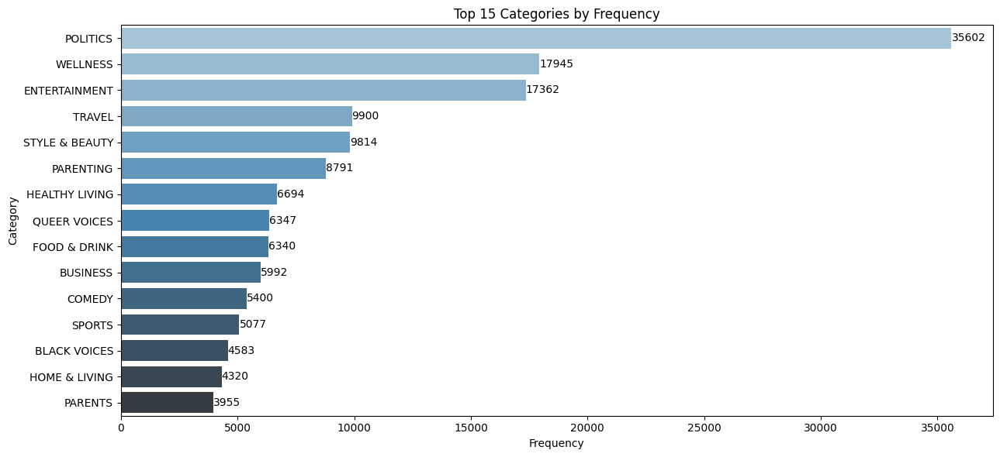

In [20]:
# Create a horizontal bar chart
plt.figure(figsize=(13, 6))
sns.barplot(x=top_15_categories.values, y=top_15_categories.index, palette='Blues_d')

# Display frequency values at the end of each bar
for i, value in enumerate(top_15_categories.values):
    plt.text(value, i, f'{int(value)}', va='center')

plt.xlabel('Frequency')
plt.ylabel('Category')
plt.title('Top 15 Categories by Frequency')
plt.tight_layout()
plt.show()


- The data is unbalanced.
- The Politics category is the most prevalent (35k), followed by Wellness (17k) and Entertainment (17k).
- We can conclude that:
    - There is a strong interest in politics.
    - There is a growing awarness of wellness.
    - There is a focus on travel and beauty.

- **Quesiton**
- "Parent" and "Parenting" can be considered similar but have different category names.
- Are there any other categories that are similar?


In [21]:
df.sample()

,headline,category,short_description,year,month,day_of_week,headline_processed,short_description_processed
146364,YogaQuirks: The 4 Rules of Yogi Etiquette,WELLNESS,"I love yoga and I've been doing it for about 10 years, but it's the practitioners, not the practice itself, I find most challenging.",2013,Dec,Monday,"[yogaquirks, rule, yogi, etiquette]","[love, yoga, ive, year, practitioner, practice, find, challenging]"


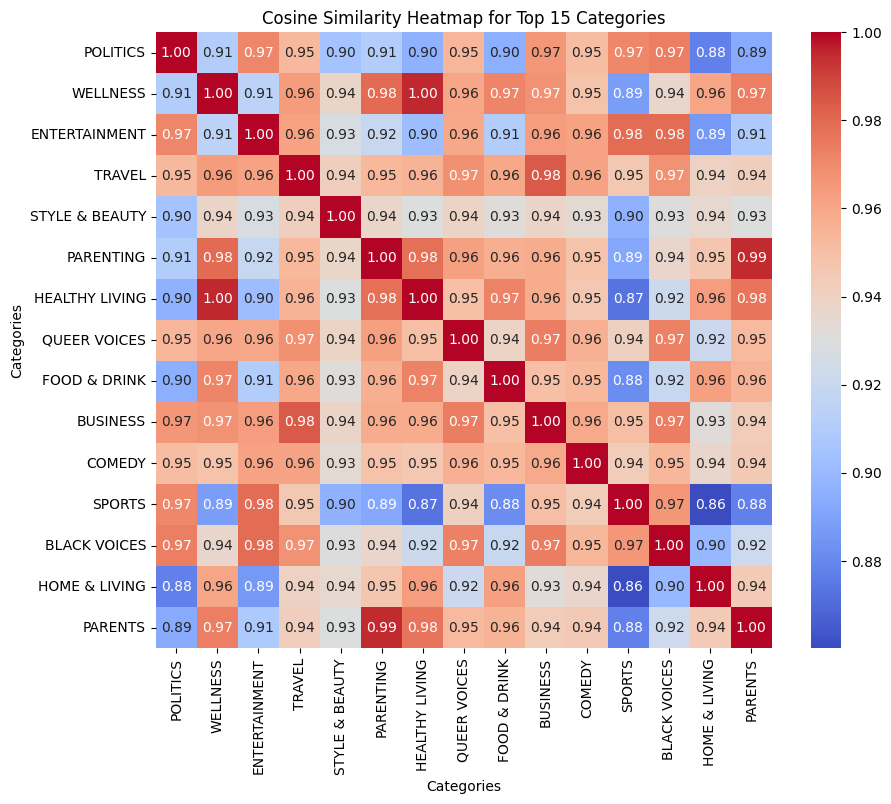

In [22]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Extract the top 15 categories
top_15_categories = df['category'].value_counts().nlargest(15).index

# Step 2: Create a dictionary to hold concatenated texts for each category
concatenated_texts = {}
for category in top_15_categories:
    concatenated_texts[category] = ' '.join(df[df['category'] == category]['short_description'].dropna().astype(str))

# Step 3: Vectorize the concatenated texts using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(list(concatenated_texts.values()))

# Step 4: Calculate the cosine similarity matrix
cosine_sim_matrix = cosine_similarity(tfidf_matrix)

# Step 5: Create a DataFrame for the cosine similarity matrix
cosine_sim_df = pd.DataFrame(cosine_sim_matrix, index=concatenated_texts.keys(), columns=concatenated_texts.keys())

# Step 6: Plot the heatmap to visualize the cosine similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cosine_sim_df, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Cosine Similarity Heatmap for Top 15 Categories')
plt.xlabel('Categories')
plt.ylabel('Categories')
plt.show()


In [23]:
df.sample()

,headline,category,short_description,year,month,day_of_week,headline_processed,short_description_processed
181943,A Chef Gets Honest About Turkey Tips -- And Brining,FOOD & DRINK,Do I really need to give my 18-pound turkey an overnight beauty bath?,2012,Nov,Tuesday,"[chef, get, honest, turkey, tip, brining]","[really, need, give, pound, turkey, overnight, beauty, bath]"


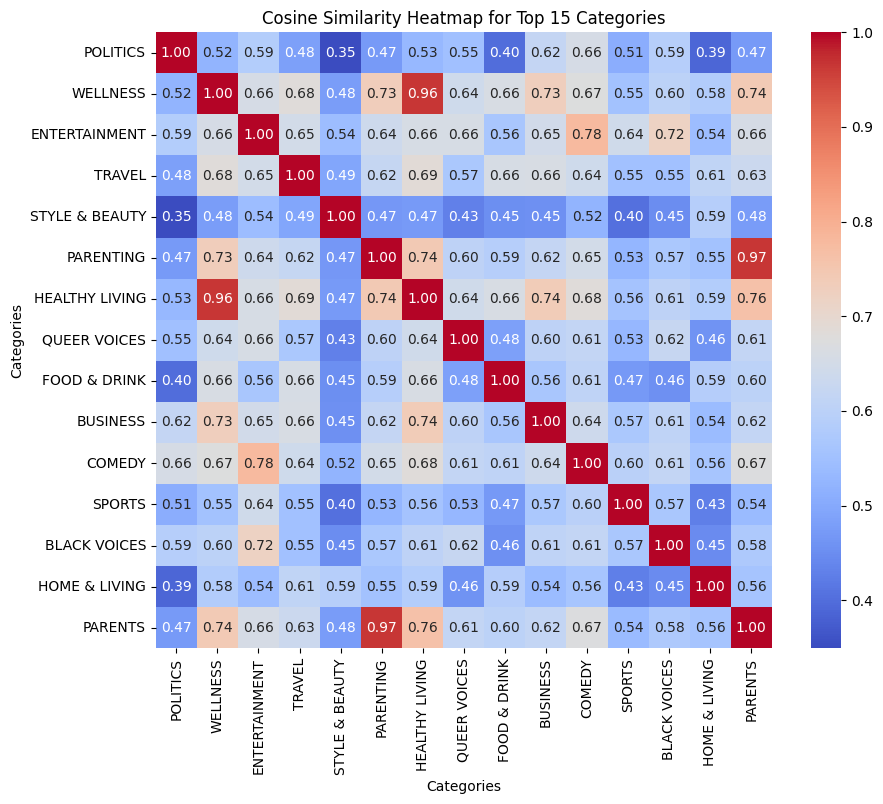

In [24]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Extract the top 15 categories
top_15_categories = df['category'].value_counts().nlargest(15).index

# Step 2: Create a dictionary to hold concatenated texts for each category
concatenated_texts = {}
for category in top_15_categories:
    concatenated_texts[category] = ' '.join(df[df['category'] == category]['short_description_processed'].dropna().astype(str))

# Step 3: Vectorize the concatenated texts using TF-IDF
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(list(concatenated_texts.values()))

# Step 4: Calculate the cosine similarity matrix
cosine_sim_matrix = cosine_similarity(tfidf_matrix)

# Step 5: Create a DataFrame for the cosine similarity matrix
cosine_sim_df = pd.DataFrame(cosine_sim_matrix, index=concatenated_texts.keys(), columns=concatenated_texts.keys())

# Step 6: Plot the heatmap to visualize the cosine similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cosine_sim_df, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Cosine Similarity Heatmap for Top 15 Categories')
plt.xlabel('Categories')
plt.ylabel('Categories')
plt.show()


**Highest Cosine Similarities**
- "WELLNESS" & "HEALTHY LIVING" have a cosine similarity of 1.
- "PARENT" & "PARENTING" have a cosine similarity of 0.99.

- We can combine these two categories into one.


In [25]:
concatenated_texts

{'POLITICS': "['president', 'issue', 'vow', 'tension', 'china', 'rise'] ['annual', 'celebration', 'took', 'different', 'feel', 'russia', 'invasion', 'dragged', 'day'] ['u', 'president', 'joe', 'biden', 'london', 'funeral', 'queen', 'elizabeth', 'ii', 'say', 'heart', 'went', 'royal', 'family', 'adding', 'queen', 'death', 'left', 'giant', 'hole'] ['republican', 'outrage', 'shoddy', 'u', 'withdrawal', 'afghanistan', 'hasnt', 'spurred', 'support', 'resettling', 'refugee'] ['former', 'white', 'house', 'chief', 'staff', 'turned', 'record', 'part', 'federal', 'investigation', 'jan', 'assault', 'capitol'] ['state', 'general', 'treasurer', 'slated', 'face', 'former', 'cranston', 'mayor', 'allan', 'fung', 'r', 'general', 'election'] ['cancer', 'discriminate', 'red', 'blue', 'president', 'said', 'monday', 'beating', 'cancer', 'something', 'together'] ['field', 'gon', 'na', 'play', 'scott', 'told', 'fox', 'news', 'sunday'] ['democrat', 'state', 'moderate', 'house', 'district', 'deciding', 'take', 

In [26]:
cosine_sim_df

,POLITICS,WELLNESS,ENTERTAINMENT,TRAVEL,STYLE & BEAUTY,PARENTING,HEALTHY LIVING,QUEER VOICES,FOOD & DRINK,BUSINESS,COMEDY,SPORTS,BLACK VOICES,HOME & LIVING,PARENTS
POLITICS,1.000000,0.521427,0.585587,0.482306,0.349221,0.471381,0.532002,0.548165,0.398596,0.617390,0.656756,0.508579,0.589804,0.388182,0.472474
WELLNESS,0.521427,1.000000,0.655265,0.682025,0.477203,0.731389,0.964478,0.639965,0.659819,0.730166,0.672354,0.554037,0.602938,0.580885,0.743147
ENTERTAINMENT,0.585587,0.655265,1.000000,0.647957,0.541625,0.638800,0.657458,0.656951,0.564585,0.645998,0.777488,0.642197,0.718399,0.540929,0.656590
TRAVEL,0.482306,0.682025,0.647957,1.000000,0.493538,0.620167,0.685240,0.569340,0.658388,0.661386,0.640430,0.551018,0.550288,0.608659,0.632798
STYLE & BEAUTY,0.349221,0.477203,0.541625,0.493538,1.000000,0.467984,0.472569,0.428398,0.451772,0.454292,0.520179,0.404808,0.450285,0.589033,0.475310
PARENTING,0.471381,0.731389,0.638800,0.620167,0.467984,1.000000,0.743624,0.603996,0.588640,0.617092,0.647104,0.526472,0.568369,0.552887,0.966902
HEALTHY LIVING,0.532002,0.964478,0.657458,0.685240,0.472569,0.743624,1.000000,0.642808,0.661641,0.735951,0.682120,0.555587,0.605533,0.585280,0.762260
QUEER VOICES,0.548165,0.639965,0.656951,0.569340,0.428398,0.603996,0.642808,1.000000,0.483013,0.604032,0.614973,0.527173,0.622347,0.458716,0.614354
FOOD & DRINK,0.398596,0.659819,0.564585,0.658388,0.451772,0.588640,0.661641,0.483013,1.000000,0.563969,0.606189,0.469639,0.455281,0.586680,0.603198
BUSINESS,0.617390,0.730166,0.645998,0.661386,0.454292,0.617092,0.735951,0.604032,0.563969,1.000000,0.637390,0.569360,0.606083,0.538380,0.615576


In [27]:
cosine_sim_matrix

array([[1.        , 0.52142683, 0.58558691, 0.48230601, 0.34922127,
        0.47138135, 0.53200193, 0.54816462, 0.39859608, 0.61739009,
        0.6567561 , 0.50857878, 0.58980431, 0.38818229, 0.47247366],
       [0.52142683, 1.        , 0.65526463, 0.68202535, 0.47720335,
        0.73138919, 0.96447794, 0.63996498, 0.65981853, 0.73016578,
        0.67235429, 0.55403742, 0.60293781, 0.58088452, 0.74314713],
       [0.58558691, 0.65526463, 1.        , 0.64795702, 0.54162499,
        0.63879972, 0.65745823, 0.65695079, 0.56458484, 0.64599762,
        0.7774885 , 0.6421974 , 0.71839915, 0.54092934, 0.65658967],
       [0.48230601, 0.68202535, 0.64795702, 1.        , 0.4935376 ,
        0.62016685, 0.68523992, 0.5693397 , 0.65838843, 0.66138578,
        0.64042958, 0.55101761, 0.55028757, 0.60865874, 0.63279771],
       [0.34922127, 0.47720335, 0.54162499, 0.4935376 , 1.        ,
        0.46798421, 0.47256856, 0.42839835, 0.45177165, 0.45429244,
        0.52017903, 0.40480803, 0.45028498, 

In [28]:
# Replace 'Parenting' with 'Parents' in the category column
df['category'] = df['category'].replace('PARENTING', 'PARENTS')
df['category'] = df['category'].replace('HEALTHY LIVING', 'WELLNESS')


In [29]:
# Extracting the top 13 categories
top_13_categories = df['category'].value_counts().nlargest(13)

# Updating the dataset to include only the top 13 categories
df = df[df['category'].isin(top_13_categories.index)]

- Visualization of the top 13 categories.

C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_2584\3111187036.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_13_categories.values, y=top_13_categories.index, palette='Blues_d')


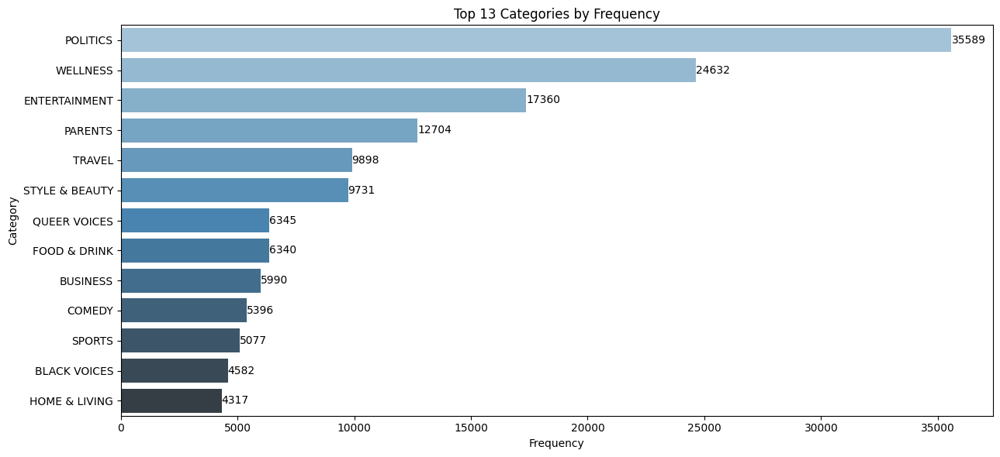

In [30]:
# Create a horizontal bar chart
plt.figure(figsize=(13, 6))
sns.barplot(x=top_13_categories.values, y=top_13_categories.index, palette='Blues_d')

# Display frequency values at the end of each bar
for i, value in enumerate(top_13_categories.values):
    plt.text(value, i, f'{int(value)}', va='center')

plt.xlabel('Frequency')
plt.ylabel('Category')
plt.title('Top 13 Categories by Frequency')
plt.tight_layout()
plt.show()


- **Top 5 Categories**
  - Politics: 35k
  - Wellness: 24k
  - Entertainment: 17k
  - Parents: 12k
  - Travel: 9k


- Pie chart of the top 13 categories.


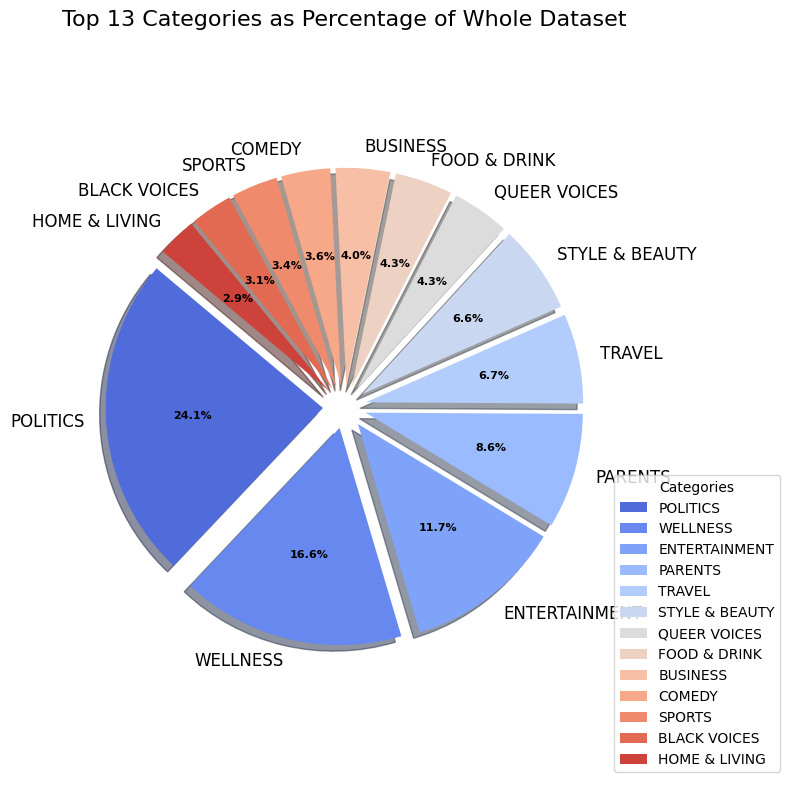

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the percentage of each category
category_percentage = (top_13_categories / df.shape[0]) * 100

# Create a pie chart with spacing
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(
    category_percentage, 
    labels=top_13_categories.index, 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=sns.color_palette('coolwarm', len(top_13_categories)),  # New color palette
    shadow=True, 
    explode=[0.1] * len(top_13_categories)  # Space between slices
)

# Enhance the text appearance
for text in texts:
    text.set_color('Black')
    text.set_fontsize(12)

for autotext in autotexts:
    autotext.set_color('Black')
    autotext.set_fontsize(8)
    autotext.set_weight('bold')

# Add a legend
plt.legend(wedges, top_13_categories.index, title="Categories", loc="lower left", bbox_to_anchor=(1, 0, 0.5, 1))

# Add a title
plt.title('Top 13 Categories as Percentage of Whole Dataset', fontsize=16, color='Black')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
plt.tight_layout()

# Display the plot
plt.show()


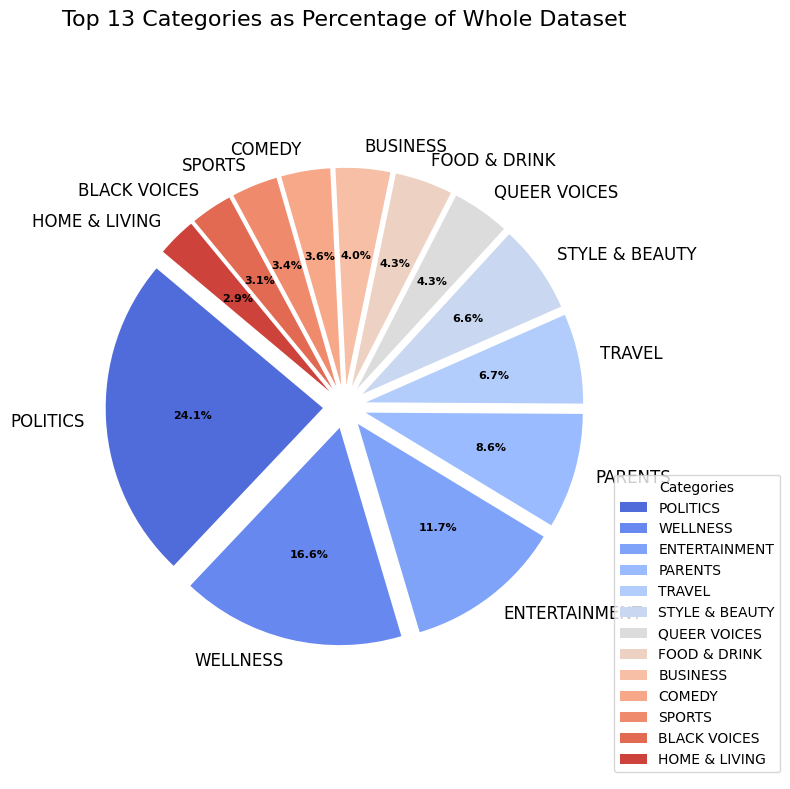

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the percentage of each category
category_percentage = (top_13_categories / df.shape[0]) * 100

# Create a pie chart with spacing
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(
    category_percentage, 
    labels=top_13_categories.index, 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=sns.color_palette('coolwarm', len(top_13_categories)),  # New color palette
    explode=[0.1] * len(top_13_categories)  # Space between slices
)

# Enhance the text appearance
for text in texts:
    text.set_color('Black')
    text.set_fontsize(12)

for autotext in autotexts:
    autotext.set_color('Black')
    autotext.set_fontsize(8)
    autotext.set_weight('bold')

# Add a legend
plt.legend(wedges, top_13_categories.index, title="Categories", loc="lower left", bbox_to_anchor=(1, 0, 0.5, 1))

# Add a title
plt.title('Top 13 Categories as Percentage of Whole Dataset', fontsize=16, color='Black')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
plt.tight_layout()

# Display the plot
plt.show()


C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_2584\283216491.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=top_13_categories.index, y=category_percentage, palette='coolwarm')


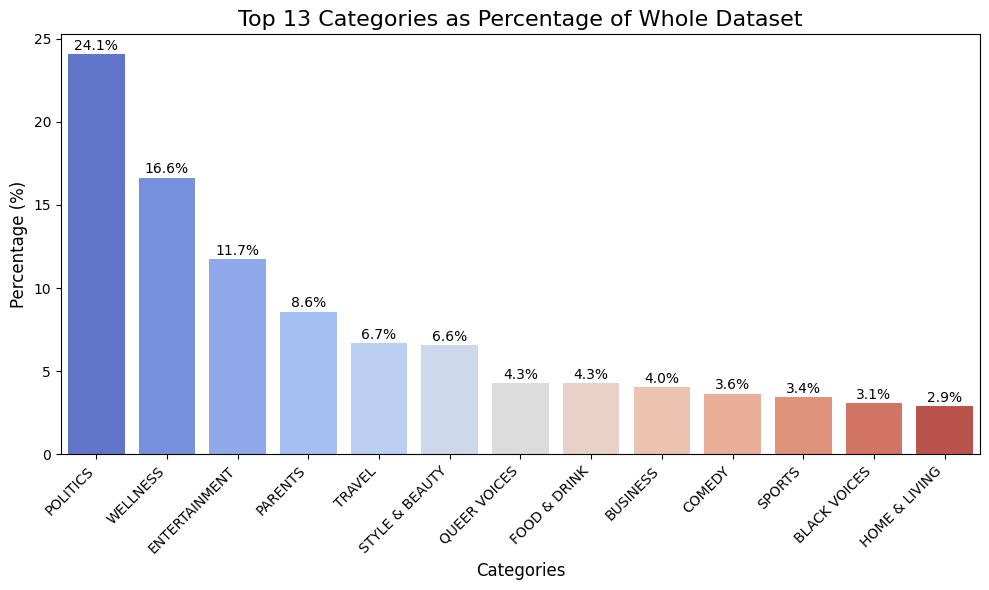

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the percentage of each category
category_percentage = (top_13_categories / df.shape[0]) * 100

# Create a bar chart
plt.figure(figsize=(10, 6))
bars = sns.barplot(x=top_13_categories.index, y=category_percentage, palette='coolwarm')

# Add the percentage text on the surface of each bar
for bar in bars.patches:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # x position: middle of the bar
        height + 0.5,  # y position: on top of the bar surface
        f'{height:.1f}%',  # Text: percentage with one decimal place
        ha='center',  # Horizontal alignment
        va='center',  # Vertical alignment: center the text
        fontsize=10,  # Font size
        color='black'  # Text color
    )

# Enhance the appearance of the chart
plt.title('Top 13 Categories as Percentage of Whole Dataset', fontsize=16, color='Black')
plt.xlabel('Categories', fontsize=12, color='Black')
plt.ylabel('Percentage (%)', fontsize=12, color='Black')
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels for better readability
plt.tight_layout()

# Display the plot
plt.show()


- Politics accounts for 24% of the whole dataset.
- The top 5 categories, i.e., [Politics, Wellness, Entertainment, Parents, Travel], cover more than 50% of the news articles.
- After politics, people are more interested in wellness and entertainment.

C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_2584\3314012961.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bars = sns.barplot(x=category_percentage.index, y=category_percentage, palette=colors)


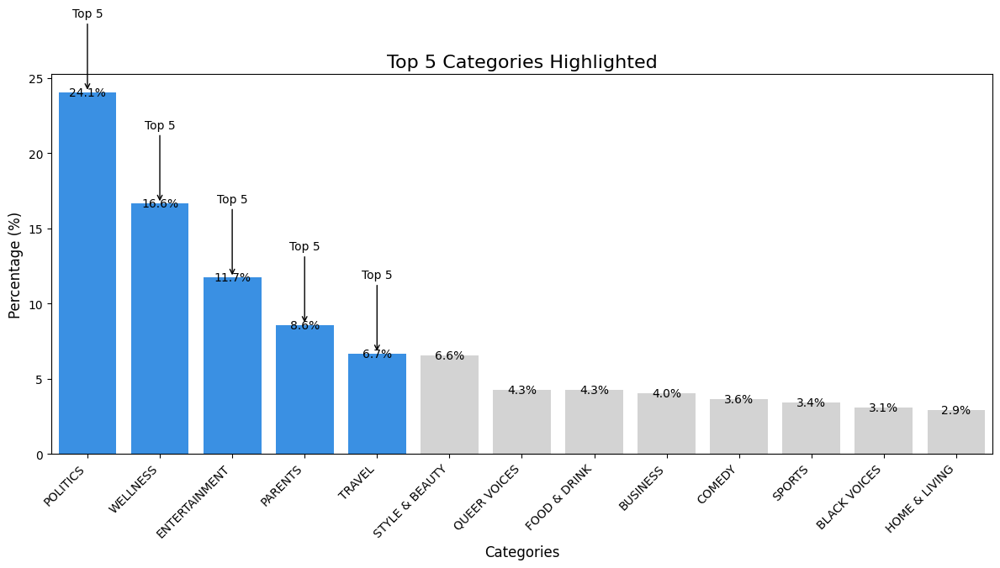

In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Calculate the percentage of each category
category_percentage = (top_13_categories / df.shape[0]) * 100

# Define the top 5 categories
top_5 = category_percentage.nlargest(5)

# Create a bar chart
plt.figure(figsize=(12, 7))

# Define colors: use a distinct color for top 5, and a lighter color for the rest
colors = ['dodgerblue' if category in top_5.index else 'lightgray' for category in category_percentage.index]

bars = sns.barplot(x=category_percentage.index, y=category_percentage, palette=colors)

# Add the percentage text on the surface of each bar
for bar in bars.patches:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # x position: middle of the bar
        height,  # y position: on top of the bar surface
        f'{height:.1f}%',  # Text: percentage with one decimal place
        ha='center',  # Horizontal alignment
        va='center',  # Vertical alignment (center the text)
        fontsize=10,  # Font size
        color='black'  # Text color
    )

# Optionally, add arrows to highlight the top 5 categories
for i, bar in enumerate(bars.patches):
    if category_percentage.index[i] in top_5.index:
        # Get the position of the bar
        bar_height = bar.get_height()
        # Add an arrow pointing to the bar
        plt.annotate(
            'Top 5',  # Text label for the arrow
            xy=(bar.get_x() + bar.get_width() / 2, bar_height),  # Arrow position (top of the bar)
            xytext=(bar.get_x() + bar.get_width() / 2, bar_height + 5),  # Text position (above the bar)
            arrowprops=dict(arrowstyle="->", color='black'),  # Arrow style
            ha='center', fontsize=10, color='black'
        )

# Enhance the appearance of the chart
plt.title('Top 5 Categories Highlighted', fontsize=16, color='Black')
plt.xlabel('Categories', fontsize=12, color='Black')
plt.ylabel('Percentage (%)', fontsize=12, color='Black')
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-axis labels for better readability
plt.tight_layout()

# Display the plot
plt.show()


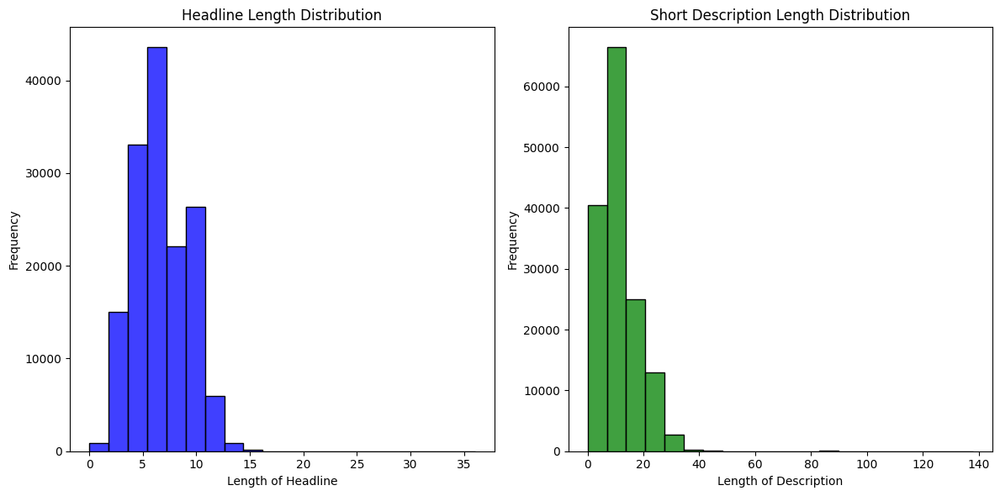

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Calculate the lengths of text for each column
df['headline_length'] = df['headline_processed'].apply(len)
df['description_length'] = df['short_description_processed'].apply(len)

# Step 2: Plotting

plt.figure(figsize=(12, 6))

# Plotting the distribution of headline lengths
plt.subplot(1, 2, 1)
sns.histplot(df['headline_length'], bins=20, color='blue')
plt.title('Headline Length Distribution')
plt.xlabel('Length of Headline')
plt.ylabel('Frequency')

# Plotting the distribution of description lengths
plt.subplot(1, 2, 2)
sns.histplot(df['description_length'], bins=20, color='green')
plt.title('Short Description Length Distribution')
plt.xlabel('Length of Description')
plt.ylabel('Frequency')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()


- There are very few rows in which the headline isn't present.
- The majority of headlines have lengths between 5 to 10 words.
- Most short descriptions are between 0 to 20 word length, with a significant number having a length of 0.


In [33]:
# Count the number of rows where description_length is 0
total_description_zero = df[df['description_length'] == 0].shape[0]

# Output the result for description_length
print(f"Total number of rows where description_length is 0: {total_description_zero}")

# Count the number of rows where headline_length is 0
total_headline_zero = df[df['headline_length'] == 0].shape[0]

# Output the result for headline_length
print(f"Total number of rows where headline_length is 0: {total_headline_zero}")

# Count the number of rows where both headline_length and description_length are 0
total_both_zero = df[(df['headline_length'] == 0) & (df['description_length'] == 0)].shape[0]

# Output the result for both headline_length and description_length
print(f"Total number of rows where both headline_length and description_length are 0: {total_both_zero}")


Total number of rows where description_length is 0: 11798
Total number of rows where headline_length is 0: 54
Total number of rows where both headline_length and description_length are 0: 10


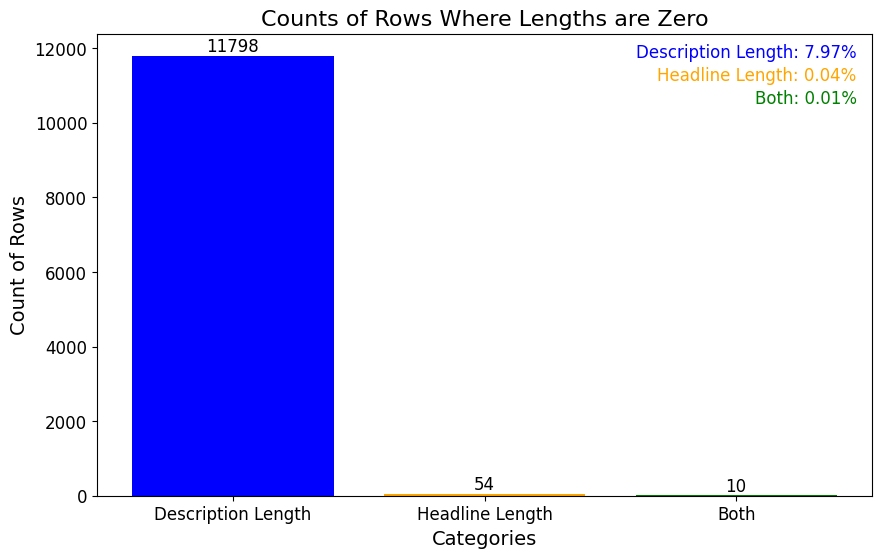

In [34]:
import matplotlib.pyplot as plt

# Data for the counts
categories = ['Description Length', 'Headline Length', 'Both']
counts = [total_description_zero, total_headline_zero, total_both_zero]

# Calculate total number of rows (assuming it's defined somewhere in your script)
total_rows = len(df)  # Example: total number of rows in your DataFrame

# Calculate percentages relative to total rows
percentages = [(count / total_rows) * 100 for count in counts]

# Create a bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(categories, counts, color=['blue', 'orange', 'green'])

# Add frequency labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, yval, ha='center', va='bottom', fontsize=12)

# Add percentage text at the top right of the graph
percentage_text = '\n'.join([f'{cat}: {perc:.2f}%' for cat, perc in zip(categories, percentages)])
colors = ['blue', 'orange', 'green']
for i, line in enumerate(percentage_text.split('\n')):
    plt.text(0.98, 0.98 - i*0.05, line, transform=plt.gca().transAxes, fontsize=12, 
             va='top', ha='right', color=colors[i])

# Set titles and labels
plt.title('Counts of Rows Where Lengths are Zero', fontsize=16)
plt.xlabel('Categories', fontsize=14)
plt.ylabel('Count of Rows', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(False)  # Disable the grid

# Show the plot
plt.show()


- No. of rows where description_length is 0: 11798
- No. of rows where headline_length is 0: 54
- No. of rows where both headline_length and description_length are 0: 10

In [35]:

# Remove rows where both 'description_length' and 'headline_length' are zero
df = df[~((df['description_length'] == 0) & (df['headline_length'] == 0))]

C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_2584\3817038312.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='category', y='headline_length', data=df, palette='Blues', inner='quartile')


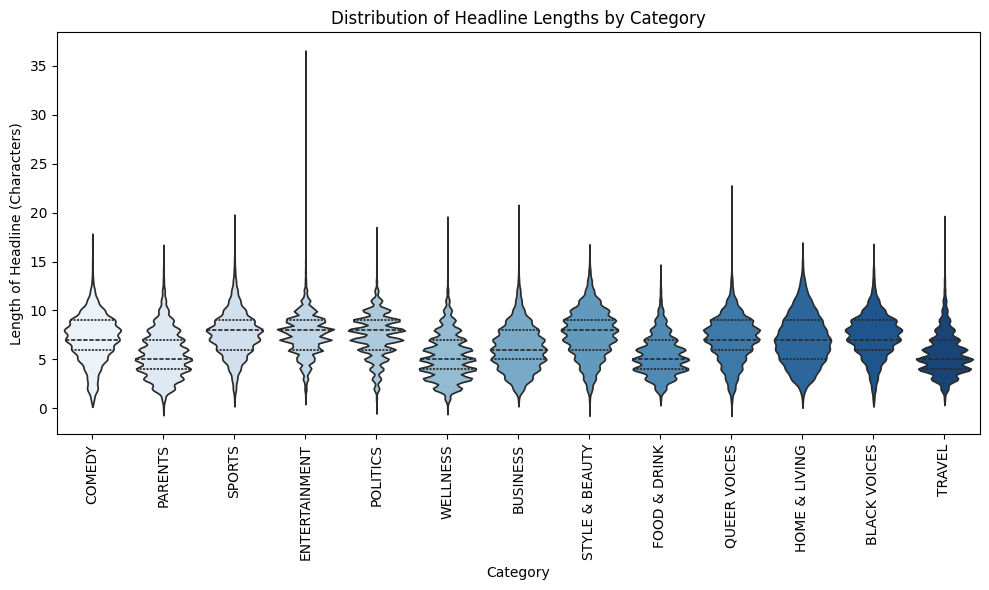

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a new figure with specified size
plt.figure(figsize=(10, 6))

sns.violinplot(x='category', y='headline_length', data=df, palette='Blues', inner='quartile')

# Set the title of the plot
plt.title('Distribution of Headline Lengths by Category')

# Set the label for the x-axis
plt.xlabel('Category')

# Set the label for the y-axis
plt.ylabel('Length of Headline (Characters)')

# Rotate the x-axis tick labels by 90 degrees for better readability
plt.xticks(rotation=90)

# Adjust the layout to make sure everything fits well in the figure
plt.tight_layout()

# Display the plot
plt.show()


- **Variation in Headline Lengths:** 
  - Each category shows a distinct distribution of headline lengths.
  
- **Entertainment Category:**
  - Has the widest distribution with some headlines reaching up to 35 word length.

- **Comedy, Parents, and Politics:**
  - These categories have shorter median headline lengths, typically under 10 word length.

C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_2584\2943631301.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=avg_length_by_category.values, y=avg_length_by_category.index, palette='Blues_d')


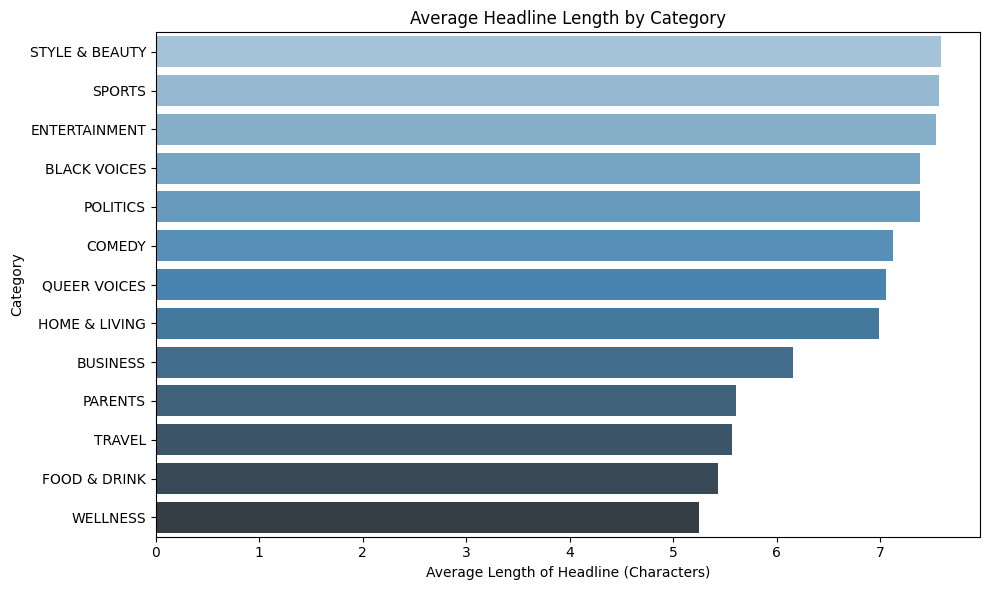

In [37]:
plt.figure(figsize=(10, 6))
avg_length_by_category = df.groupby('category')['headline_length'].mean().sort_values(ascending=False)
sns.barplot(x=avg_length_by_category.values, y=avg_length_by_category.index, palette='Blues_d')
plt.title('Average Headline Length by Category')
plt.xlabel('Average Length of Headline (Characters)')
plt.ylabel('Category')
plt.tight_layout()
plt.show()


- Average length is around 6-7 in headline.

C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_18472\1176932235.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_words.values, y=top_words.index, palette='Blues_d')
C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_18472\1176932235.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_words.values, y=top_words.index, palette='Blues_d')
C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_18472\1176932235.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_words.values, y=top_words.index, palette='Blues_d')
C:\Users\k

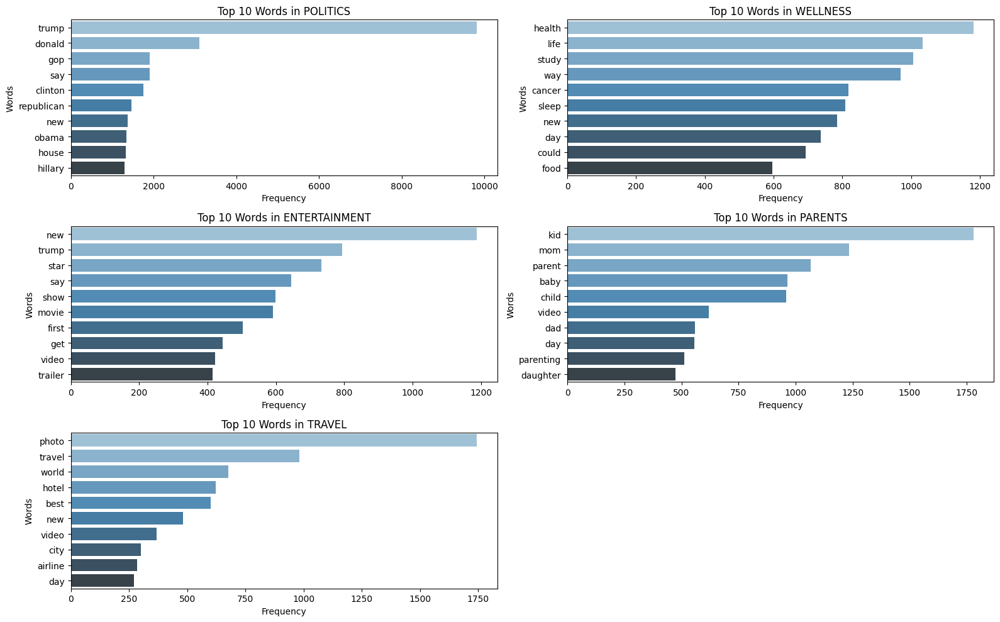

In [35]:
# Top 10 words in top 5 Category.

from collections import Counter

# Perform word frequency analysis for each category
category_word_counts = {}
for category in df['category'].unique():
    # Filter the dataframe for the current category
    category_df = df[df['category'] == category]
    
    # Combine all words in this category
    all_words = sum(category_df['headline_processed'], [])
    
    # Count word frequencies
    word_counts = Counter(all_words).most_common(10)  # Get top 10 most common words for the category
    category_word_counts[category] = dict(word_counts)

word_counts_df = pd.DataFrame(category_word_counts)# Loop through the top 5 categories

top_5_categories = df['category'].value_counts().index[:5]

plt.figure(figsize=(16, 10))

# Create subplots for the top 5 categories
for i, category in enumerate(top_5_categories, 1):
    # Get the top words for the current category
    top_words = word_counts_df[category].dropna().sort_values(ascending=False)[:10]  # Top 10 words

    # Create a subplot for each category
    plt.subplot(3, 2, i)
    sns.barplot(x=top_words.values, y=top_words.index, palette='Blues_d')
    
    # Set the title and labels
    plt.title(f'Top 10 Words in {category}')
    plt.xlabel('Frequency')
    plt.ylabel('Words')

# Adjust layout
plt.tight_layout()
plt.show()


**Politics**
- "Donald Trump" is the most searched keyword.

**Wellness**
- "Health," "life," and "sleep" are the most searched words.

**Entertainment**
- "Trump," "movie," and "video" are popular search terms.

**Parent**
- "Kid," "mom," "dad," and "daughter" are frequently searched words.

**Travel**
- "Hotel," "photo," "airline," and "vacation" are the most searched terms.


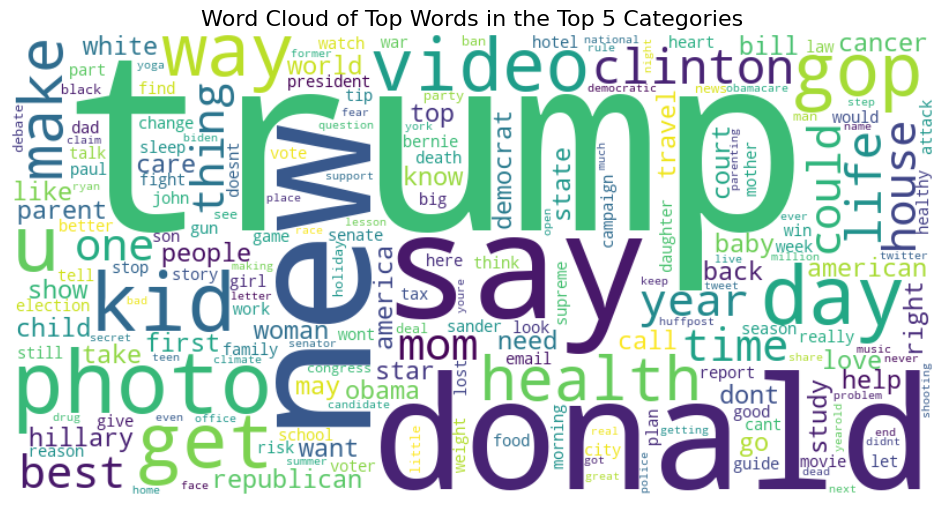

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
from wordcloud import WordCloud

# Assuming 'df' is your DataFrame with columns 'category' and 'headline_processed'

# Get the top 5 categories based on their frequency
top_5_categories = df['category'].value_counts().index[:5]

# Initialize an empty list to hold words from the top categories
top_words = []

# Combine all words from the headlines in the top 5 categories
for category in top_5_categories:
    category_words = sum(df[df['category'] == category]['headline_processed'], [])
    top_words.extend(category_words)

# Count word frequencies for the combined words from top categories
word_counts = Counter(top_words)

# Create a word cloud with the combined words from top 5 categories
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)

# Plotting the word cloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.title('Word Cloud of Top Words in the Top 5 Categories', fontsize=16)
plt.show()


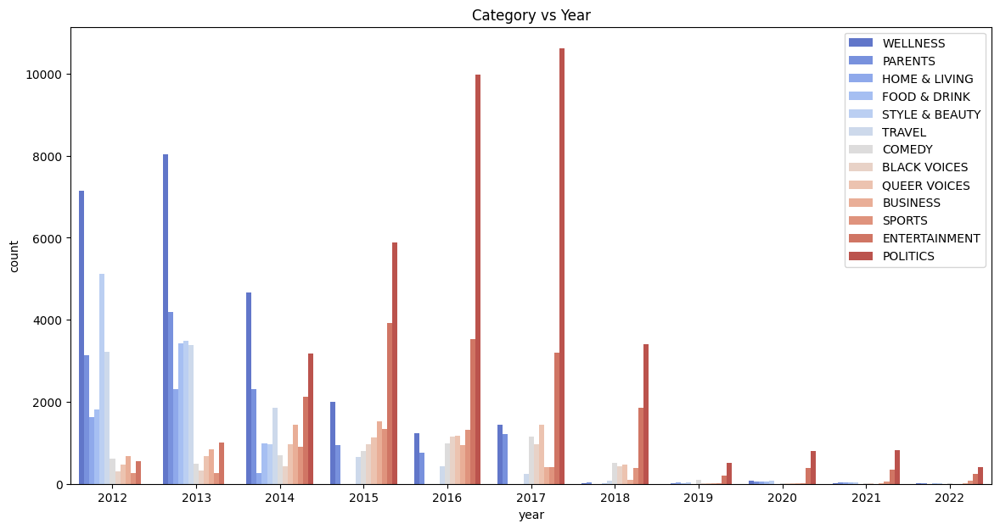

In [37]:
# Plotting category vs year
plt.figure(figsize=(14, 7))
sns.countplot(data=df, x='year', hue='category', palette='coolwarm')
plt.title('Category vs Year')
plt.legend(loc='upper right')
plt.show()


### Category vs. Year Distribution

The figure illustrates the distribution of articles across different categories over the years from 2012 to 2022. Key observations:

- **Peak in 2016-2017**: Categories like **Politics**, **Entertainment**, and **Sports** saw significant peaks during these years.
- **Earlier Years (2012-2014)**: Categories like **Wellness**, **Parents**, and **Food & Drink** dominated with more frequent publications.
- **Decline Post-2017**: After 2017, the number of articles across most categories dropped, with very few entries between 2018-2022.


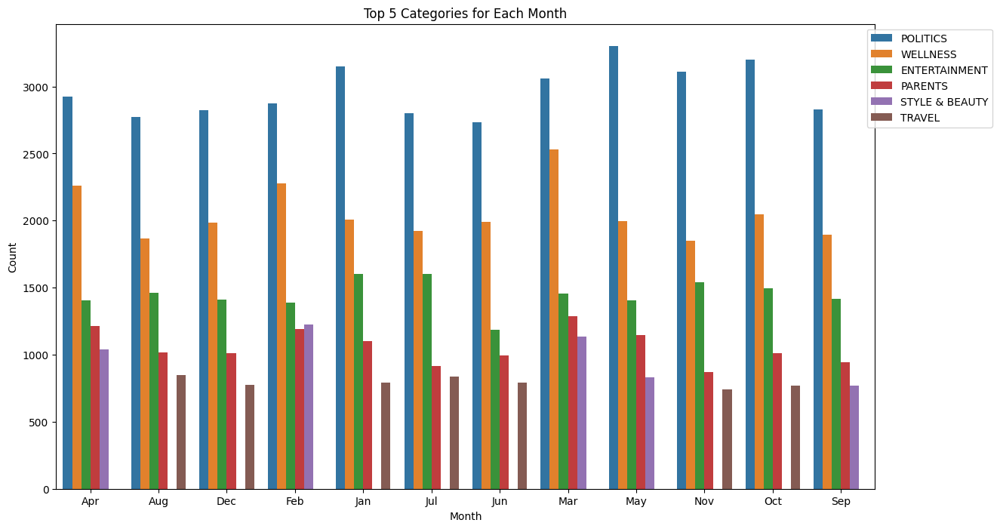

In [38]:
# Group by month and category, then count the occurrences of top 5 Category
category_counts = df.groupby(['month', 'category']).size().reset_index(name='count')

# Sort the counts by month and then by category count
category_counts = category_counts.sort_values(by=['month', 'count'], ascending=[True, False])

# Get the top 5 categories for each month
top5_categories_per_month = category_counts.groupby('month').head(5)

# Plot the results
plt.figure(figsize=(14, 8))
sns.barplot(x='month', y='count', hue='category', data=top5_categories_per_month, palette='tab10')
plt.title('Top 5 Categories for Each Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()


- Every month, news related to Politics was the most frequent, followed by Wellness and then Entertainment.

In [39]:
def undersample_categories(df, target_column, max_count):
    # Group by the target column and apply undersampling
    undersampled_df = df.groupby(target_column).apply(
        lambda x: x.sample(min(len(x), max_count), random_state=42) if len(x) > max_count else x
    ).reset_index(drop=True)
    
    return undersampled_df

# Apply undersampling with a maximum of 10,000 instances per category
undersampled_df = undersample_categories(df, 'category', max_count=10000)

print("\nUndersampled Class Distribution:")
print(undersampled_df['category'].value_counts())


Undersampled Class Distribution:
category
ENTERTAINMENT     10000
PARENTS           10000
POLITICS          10000
WELLNESS          10000
TRAVEL             9898
STYLE & BEAUTY     9731
QUEER VOICES       6344
FOOD & DRINK       6340
BUSINESS           5989
COMEDY             5394
SPORTS             5077
BLACK VOICES       4582
HOME & LIVING      4317
Name: count, dtype: int64


C:\Users\khushal.garg\AppData\Local\Temp\ipykernel_18472\808356743.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  undersampled_df = df.groupby(target_column).apply(


# Traditional ML Approach

In [40]:
df.sample()

,headline,category,short_description,year,month,day_of_week,headline_processed,short_description_processed,headline_length,description_length
172932,Crispy Kale Chips With Black Roasted Sesame Seeds,FOOD & DRINK,"Crispy, crunchy and addictive, it will be nearly impossible to eat just one of these Kale Chips with Black Roasted Sesame Seeds. If you've never tried kale chips before, you are missing out.",2013,Feb,Monday,"[crispy, kale, chip, black, roasted, sesame, seed]","[crispy, crunchy, addictive, nearly, impossible, eat, one, kale, chip, black, roasted, sesame, seed, youve, never, tried, kale, chip, missing]",7,19


## Using TF-IDF vectorization

In [41]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.feature_extraction.text import TfidfVectorizer

- Train and evaluate on Naive Bayes

In [42]:


import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score


# Step 1: Convert text data into numerical form using TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df["headline_processed"])  # Convert all text into numeric features

# Step 2: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, df['category'], test_size=0.20, random_state=42)

# Step 3: Train Naive Bayes model
nb_model = MultinomialNB()
nb_model.fit(X_train, y_train)

# Step 4: Make predictions with Naive Bayes model
y_pred_nb = nb_model.predict(X_test)

# Step 5: Evaluate Naive Bayes model
print("Naive Bayes Model:")
print("Accuracy:", accuracy_score(y_test, y_pred_nb))

# Calculate precision, recall, and F1-score
precision = precision_score(y_test, y_pred_nb, average='weighted')
recall = recall_score(y_test, y_pred_nb, average='weighted')
f1 = f1_score(y_test, y_pred_nb, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred_nb))



AttributeError: 'list' object has no attribute 'lower'

In [81]:


import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score


# Step 1: Convert text data into numerical form using TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df["headline_processed"])  # Convert all text into numeric features
# Step 2: Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, df['category'], test_size=0.25, random_state=42)

# Step 3: Train Naive Bayes model
nb_model = MultinomialNB()
nb_model.fit(X_train, y_train)

# Step 4: Make predictions with Naive Bayes model
y_pred_nb = nb_model.predict(X_test)

# Step 5: Evaluate Naive Bayes model
print("Naive Bayes Model:")
print("Accuracy:", accuracy_score(y_test, y_pred_nb))

# Calculate precision, recall, and F1-score
precision = precision_score(y_test, y_pred_nb, average='weighted')
recall = recall_score(y_test, y_pred_nb, average='weighted')
f1 = f1_score(y_test, y_pred_nb, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred_nb))



AttributeError: 'list' object has no attribute 'lower'

- Train and evaluate on LogisticRegression

In [66]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, df['category'], test_size=0.25, random_state=42)

# Initialize and train the Logistic Regression model
log_reg_model = LogisticRegression(max_iter=1000)
log_reg_model.fit(X_train, y_train)

# Make predictions with the Logistic Regression model
y_pred_lr = log_reg_model.predict(X_test)

# Evaluate the Logistic Regression model
print("\nLogistic Regression Model:")
print("Accuracy:", accuracy_score(y_test, y_pred_lr))

# Calculate precision, recall, and F1-score
precision = precision_score(y_test, y_pred_lr, average='weighted')
recall = recall_score(y_test, y_pred_lr, average='weighted')
f1 = f1_score(y_test, y_pred_lr, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred_lr))


Logistic Regression Model:
Accuracy: 0.7448361630799178
Precision: 0.7477122606992886
Recall: 0.7448361630799178
F1 Score: 0.7376099893030119

Classification Report:
                precision    recall  f1-score   support

  BLACK VOICES       0.66      0.34      0.45      1092
      BUSINESS       0.69      0.42      0.52      1501
        COMEDY       0.68      0.41      0.51      1359
 ENTERTAINMENT       0.68      0.75      0.71      4344
  FOOD & DRINK       0.83      0.67      0.74      1646
 HOME & LIVING       0.82      0.66      0.73      1075
       PARENTS       0.75      0.70      0.72      3170
      POLITICS       0.80      0.90      0.84      8883
  QUEER VOICES       0.85      0.63      0.73      1510
        SPORTS       0.77      0.61      0.68      1259
STYLE & BEAUTY       0.80      0.78      0.79      2439
        TRAVEL       0.80      0.75      0.77      2506
      WELLNESS       0.66      0.85      0.74      6204

      accuracy                           0.74  

## Using with n-gram ranges

### Ngram range --> (1,2)

In [69]:
# Step 1: If 'headline_processed' contains tokenized text (lists of words), convert lists back to strings
df['headline_processed'] = df['headline_processed'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

# Step 2: Convert text data into numerical form using TfidfVectorizer with n-grams (1, 2)
vectorizer_1_2 = TfidfVectorizer(ngram_range=(1, 2))  # Use unigrams and bigrams

# Transform the text data to numeric form
X_1_2 = vectorizer_1_2.fit_transform(df["headline_processed"])  # Convert all text into numeric features

# Split the data into training and testing sets
X_train_1_2, X_test_1_2, y_train_1_2, y_test_1_2 = train_test_split(X_1_2, df['category'], test_size=0.2, random_state=42)



# Train Naive Bayes model
nb_model_1_2 = MultinomialNB()
nb_model_1_2.fit(X_train_1_2, y_train_1_2)

# Make predictions with Naive Bayes model
y_pred_nb_1_2 = nb_model_1_2.predict(X_test_1_2)

# Evaluate Naive Bayes model
print("\nNaive Bayes Model (N-grams 1, 2):")
print("Accuracy:", accuracy_score(y_test_1_2, y_pred_nb_1_2))

# Calculate precision, recall, and F1-score
precision = precision_score(y_test_1_2, y_pred_nb_1_2, average='weighted')
recall = recall_score(y_test_1_2, y_pred_nb_1_2, average='weighted')
f1 = f1_score(y_test_1_2, y_pred_nb_1_2, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_test_1_2, y_pred_nb_1_2))


Naive Bayes Model (N-grams 1, 2):
Accuracy: 0.5419891183130006


c:\Users\khushal.garg\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Precision: 0.6887445383172275
Recall: 0.5419891183130006
F1 Score: 0.4756861741700424

Classification Report:


c:\Users\khushal.garg\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


                precision    recall  f1-score   support

  BLACK VOICES       0.00      0.00      0.00       863
      BUSINESS       0.93      0.02      0.04      1194
        COMEDY       0.90      0.02      0.03      1100
 ENTERTAINMENT       0.66      0.64      0.65      3488
  FOOD & DRINK       0.96      0.22      0.36      1337
 HOME & LIVING       0.98      0.16      0.28       867
       PARENTS       0.89      0.28      0.42      2542
      POLITICS       0.44      0.99      0.60      7057
  QUEER VOICES       0.97      0.05      0.10      1217
        SPORTS       0.94      0.03      0.06      1012
STYLE & BEAUTY       0.92      0.52      0.67      1988
        TRAVEL       0.91      0.32      0.47      2003
      WELLNESS       0.56      0.79      0.65      4923

      accuracy                           0.54     29591
     macro avg       0.77      0.31      0.33     29591
  weighted avg       0.69      0.54      0.48     29591



c:\Users\khushal.garg\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\khushal.garg\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [70]:
# Train Logistic Regression model
log_reg_model_1_2 = LogisticRegression(max_iter=1000)
log_reg_model_1_2.fit(X_train_1_2, y_train_1_2)

# Make predictions with Logistic Regression model
y_pred_lr_1_2 = log_reg_model_1_2.predict(X_test_1_2)

# Evaluate Logistic Regression model
print("\nLogistic Regression Model (N-grams 1, 2):")
print("Accuracy:", accuracy_score(y_test_1_2, y_pred_lr_1_2))

# Calculate precision, recall, and F1-score
precision = precision_score(y_test_1_2, y_pred_lr_1_2, average='weighted')
recall = recall_score(y_test_1_2, y_pred_lr_1_2, average='weighted')
f1 = f1_score(y_test_1_2, y_pred_lr_1_2, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_test_1_2, y_pred_lr_1_2))


Logistic Regression Model (N-grams 1, 2):
Accuracy: 0.7320469061538981
Precision: 0.7441595976564467
Recall: 0.7320469061538981
F1 Score: 0.7213577886385836

Classification Report:
                precision    recall  f1-score   support

  BLACK VOICES       0.73      0.27      0.40       863
      BUSINESS       0.73      0.34      0.46      1194
        COMEDY       0.72      0.39      0.51      1100
 ENTERTAINMENT       0.69      0.75      0.72      3488
  FOOD & DRINK       0.85      0.61      0.71      1337
 HOME & LIVING       0.86      0.60      0.70       867
       PARENTS       0.76      0.70      0.73      2542
      POLITICS       0.76      0.92      0.83      7057
  QUEER VOICES       0.88      0.59      0.71      1217
        SPORTS       0.80      0.54      0.65      1012
STYLE & BEAUTY       0.79      0.76      0.77      1988
        TRAVEL       0.81      0.70      0.75      2003
      WELLNESS       0.62      0.86      0.72      4923

      accuracy                  

In [71]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.feature_extraction.text import TfidfVectorizer

In [72]:
# Step 1: If 'headline_processed' contains tokenized text (lists of words), convert lists back to strings
df['headline_processed'] = df['headline_processed'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

# Step 2: Convert text data into numerical form using TfidfVectorizer with n-grams (1, 3)
vectorizer_1_3 = TfidfVectorizer(ngram_range=(1, 3))  # Use unigrams, bigrams, and trigrams

# Transform the text data to numeric form
X_1_3 = vectorizer_1_3.fit_transform(df["headline_processed"])  # Convert all text into numeric features

# Step 3: Split the data into training and testing sets
X_train_1_3, X_test_1_3, y_train_1_3, y_test_1_3 = train_test_split(X_1_3, df['category'], test_size=0.2, random_state=42)

# Step 4: Train Naive Bayes model
nb_model_1_3 = MultinomialNB()
nb_model_1_3.fit(X_train_1_3, y_train_1_3)

# Step 5: Make predictions with Naive Bayes model
y_pred_nb_1_3 = nb_model_1_3.predict(X_test_1_3)

# Step 6: Evaluate Naive Bayes model
print("Naive Bayes Model (N-grams 1, 3):")
print("Accuracy:", accuracy_score(y_test_1_3, y_pred_nb_1_3))

# Calculate precision, recall, and F1-score
precision = precision_score(y_test_1_3, y_pred_nb_1_3, average='weighted')
recall = recall_score(y_test_1_3, y_pred_nb_1_3, average='weighted')
f1 = f1_score(y_test_1_3, y_pred_nb_1_3, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_test_1_3, y_pred_nb_1_3))


Naive Bayes Model (N-grams 1, 3):
Accuracy: 0.5040721841100334
Precision: 0.7206735104942822
Recall: 0.5040721841100334
F1 Score: 0.43068539926186855

Classification Report:
                precision    recall  f1-score   support

  BLACK VOICES       1.00      0.00      0.00       863
      BUSINESS       0.96      0.02      0.04      1194
        COMEDY       1.00      0.02      0.04      1100
 ENTERTAINMENT       0.69      0.56      0.62      3488
  FOOD & DRINK       0.97      0.15      0.26      1337
 HOME & LIVING       0.98      0.11      0.20       867
       PARENTS       0.90      0.20      0.32      2542
      POLITICS       0.40      0.99      0.57      7057
  QUEER VOICES       0.98      0.04      0.07      1217
        SPORTS       0.93      0.01      0.03      1012
STYLE & BEAUTY       0.95      0.45      0.61      1988
        TRAVEL       0.92      0.21      0.34      2003
      WELLNESS       0.55      0.77      0.64      4923

      accuracy                          

In [73]:


# Step 1: If 'headline_processed' contains tokenized text (lists of words), convert lists back to strings
df['headline_processed'] = df['headline_processed'].apply(lambda x: ' '.join(x) if isinstance(x, list) else x)

# Step 2: Convert text data into numerical form using TfidfVectorizer with n-grams (1, 3)
vectorizer_1_3 = TfidfVectorizer(ngram_range=(1, 3))  # Use unigrams, bigrams, and trigrams

# Transform the text data to numeric form
X_1_3 = vectorizer_1_3.fit_transform(df["headline_processed"])  # Convert all text into numeric features

# Step 3: Split the data into training and testing sets
X_train_1_3, X_test_1_3, y_train_1_3, y_test_1_3 = train_test_split(X_1_3, df['category'], test_size=0.2, random_state=42)

# Step 4: Train Logistic Regression model
log_reg_model_1_3 = LogisticRegression(max_iter=1000)
log_reg_model_1_3.fit(X_train_1_3, y_train_1_3)

# Step 5: Make predictions with Logistic Regression model
y_pred_lr_1_3 = log_reg_model_1_3.predict(X_test_1_3)

# Step 6: Evaluate Logistic Regression model
print("\nLogistic Regression Model (N-grams 1, 3):")
print("Accuracy:", accuracy_score(y_test_1_3, y_pred_lr_1_3))

# Calculate precision, recall, and F1-score
precision = precision_score(y_test_1_3, y_pred_lr_1_3, average='weighted')
recall = recall_score(y_test_1_3, y_pred_lr_1_3, average='weighted')
f1 = f1_score(y_test_1_3, y_pred_lr_1_3, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Optionally print classification report for detailed metrics
print("\nClassification Report:")
print(classification_report(y_test_1_3, y_pred_lr_1_3))


Logistic Regression Model (N-grams 1, 3):
Accuracy: 0.7117704707512419
Precision: 0.73009761173782
Recall: 0.7117704707512419
F1 Score: 0.696877381596797

Classification Report:
                precision    recall  f1-score   support

  BLACK VOICES       0.72      0.23      0.35       863
      BUSINESS       0.76      0.28      0.40      1194
        COMEDY       0.72      0.32      0.44      1100
 ENTERTAINMENT       0.67      0.74      0.70      3488
  FOOD & DRINK       0.86      0.56      0.68      1337
 HOME & LIVING       0.86      0.54      0.67       867
       PARENTS       0.75      0.69      0.72      2542
      POLITICS       0.73      0.92      0.81      7057
  QUEER VOICES       0.89      0.54      0.68      1217
        SPORTS       0.79      0.46      0.58      1012
STYLE & BEAUTY       0.78      0.73      0.75      1988
        TRAVEL       0.81      0.67      0.73      2003
      WELLNESS       0.60      0.86      0.71      4923

      accuracy                     

### Model Performance Comparison (in %)

| Model                                   | Accuracy (%) | Precision (%) | Recall (%)  | F1 Score (%) |
|-----------------------------------------|--------------|---------------|-------------|--------------|
| **Naive Bayes Model**                   | 61.76        | 71.37         | 61.76       | 56.59        |
| **Logistic Regression Model**           | 74.48        | 74.77         | 74.48       | 73.76        |
| **Naive Bayes Model (N-grams 1, 2)**    | 54.20        | 68.87         | 54.20       | 47.57        |
| **Logistic Regression Model (N-grams 1, 2)** | 73.20    | 74.42         | 73.20       | 72.14        |
| **Naive Bayes Model (N-grams 1, 3)**    | 50.41        | 72.07         | 50.41       | 43.07        |
| **Logistic Regression Model (N-grams 1, 3)** | 71.18    | 73.01         | 71.18       | 69.69        |


# Model Performance Summary

## TF-IDF Vectorization

### Naive Bayes Model
- **Accuracy:** 0.6233

### Logistic Regression Model
- **Accuracy:** 0.7453

---

## TF-IDF + N-gram Ranges

### Naive Bayes Model (1, 2)
- **Accuracy:** 0.5391

### Logistic Regression Model (1, 2)
- **Accuracy:** 0.7350

---

### Naive Bayes Model (1, 3)
- **Accuracy:** 0.5004

### Logistic Regression Model (1, 3)
- **Accuracy:** 0.7188


# Deep Learning Apporach

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Bidirectional
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Dropout, BatchNormalization
import tensorflow as tf

# Initialize the LabelEncoder
label_encoder = LabelEncoder()


In [ ]:
# Tokenize the text
tokenizer = Tokenizer(num_words=15000)  # Adjust the number of words as needed
tokenizer.fit_on_texts(df['headline_processed'])
sequences = tokenizer.texts_to_sequences(df['headline_processed'])

# Pad the sequences
max_length = 100  # Adjust max_length based on your data
X = pad_sequences(sequences, maxlen=max_length)
y = df['category']

# Convert labels to numeric values
y = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# Ensure TensorFlow uses the GPU if available
physical_devices = tf.config.list_physical_devices('GPU')

if len(physical_devices) > 0:
    print(f"GPU detected: {physical_devices}")
    try:
        # Set memory growth to avoid memory allocation issues
        for device in physical_devices:
            tf.config.experimental.set_memory_growth(device, True)
    except RuntimeError as e:
        print(e)
else:
    print("No GPU detected. Using CPU instead.")




In [ ]:
# Define the enhanced model with additional layers
with tf.device('/GPU:0'):  # Explicitly set the GPU device
    model = Sequential()

    # Embedding Layer
    model.add(Embedding(input_dim=15000, output_dim=128, input_length=max_length))  # Adjust input_dim as needed

    # Add Bi-LSTM Layer
    model.add(Bidirectional(LSTM(128, return_sequences=True, dropout=0.35)))  # Return sequences to stack more LSTM layers

    # Add another Bi-LSTM Layer
    model.add(Bidirectional(LSTM(64, dropout=0.35)))  # Stack another LSTM with fewer units

    # Add Batch Normalization to stabilize and accelerate training
    model.add(BatchNormalization())

    # Add another Dense Layer with Dropout to avoid overfitting
    model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)))  # L2 regularization added
    model.add(Dropout(0.4))  # Dropout layer with 40% rate

    # Add Output Layer
    model.add(Dense(len(label_encoder.classes_), activation='softmax'))  # Output for multi-class classification

    # Compile the model
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model on the GPU
with tf.device('/GPU:0'):
    history = model.fit(X_train, y_train, epochs=6, batch_size=32, validation_data=(X_test, y_test))


In [ ]:
# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.2f}")

# If using a feedforward model, you can also print loss
print(f"Test Loss: {loss:.2f}")


In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.ylim(0, 1)  # Set y-axis limits for accuracy

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.ylim(0, max(max(history.history['loss']), max(history.history['val_loss'])) * 1.1)  # Set y-axis limits for loss

plt.tight_layout()
plt.show()

# Transfer Learning 

In [ ]:
import pandas as pd
import torch
import numpy as np
from transformers import BertTokenizerFast, BertForSequenceClassification, Trainer, TrainingArguments
from sklearn.model_selection import train_test_split
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder
from transformers import DataCollatorWithPadding
from sklearn.metrics import accuracy_score, f1_score


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


In [ ]:
# Encode categories into integers
label_encoder = LabelEncoder()
df['category_encoded'] = label_encoder.fit_transform(df['category'])

# Split data into train and validation sets
train_texts, val_texts, train_labels, val_labels = train_test_split(
    df['headline'], df['category_encoded'], test_size=0.3, random_state=42
)

# Convert to pandas dataframe for easier manipulation
train_df = pd.DataFrame({'headline': train_texts, 'category': train_labels})
val_df = pd.DataFrame({'headline': val_texts, 'category': val_labels})


In [ ]:
# Load the BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained('bert-base-uncased')

# Tokenize the text
def tokenize_function(examples):
    return tokenizer(examples['headline'], truncation=True, padding=True, max_length=128)

# Convert the pandas dataframe to HuggingFace Dataset
train_dataset = Dataset.from_pandas(train_df)
val_dataset = Dataset.from_pandas(val_df)

# Apply the tokenizer on the dataset
train_dataset = train_dataset.map(tokenize_function, batched=True)
val_dataset = val_dataset.map(tokenize_function, batched=True)


In [ ]:
data_collator = DataCollatorWithPadding(tokenizer=tokenizer)


In [ ]:
# Get number of unique labels
num_labels = len(df['category_encoded'].unique())

# Load BERT model and move it to GPU
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=num_labels).to(device)


In [ ]:
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    acc = accuracy_score(labels, predictions)
    f1 = f1_score(labels, predictions, average='weighted')  # Optionally include F1 score
    return {"accuracy": acc, "f1": f1}


In [ ]:
# Add the labels to the dataset
train_dataset = train_dataset.rename_column("category", "labels")
val_dataset = val_dataset.rename_column("category", "labels")

training_args = TrainingArguments(
    output_dir='./results',
    evaluation_strategy="epoch",
    save_strategy = "no",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
    report_to="none",  
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,  
)


In [ ]:
metrics = trainer.evaluate()
print(f"Validation Loss: {metrics['eval_loss']}")
print(f"Validation Accuracy: {metrics['eval_accuracy']}")

In [43]:
import matplotlib.pyplot as plt
import numpy as np

# Data
models = ['Logistic Regression', 'RoBerta', 'Bi-LSTM']
f1_score = [0.7403, 0.8036, 0.7261]

# X-axis labels
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

# Preparing the data for plotting
values = np.array([accuracy, precision, recall, f1_score])
bar_width = 0.15
x = np.arange(len(models))

# Plotting
plt.figure(figsize=(10, 6))
for i in range(len(metrics)):
    plt.plot(x, values[i], marker='o', label=metrics[i])

# Adding labels and title
plt.title('Model Performance Metrics')
plt.xlabel('Models')
plt.ylabel('Metrics')
plt.xticks(x, models)
plt.ylim(0.6, 1.0)  # Set y-axis limits to focus on the relevant range
plt.legend()
plt.grid()

# Show plot
plt.tight_layout()
plt.show()


NameError: name 'accuracy' is not defined

NameError: name 'python' is not defined

In [2]:
!pip install kaggle



  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for kaggle: filename=kaggle-1.6.17-py3-none-any.whl size=105797 sha256=8b5a3a3e661f7ba56a9d3341087fa205c854badc5a8701f172b1be1f58e5ae99
  Stored in directory: c:\users\khushal.garg\appdata\local\pip\cache\wheels\46\d2\26\84d0a1acdb9c6baccf7d28cf06962ec80529fe1ad938489983
Successfully built kaggle
